In [11]:
import warnings
warnings.filterwarnings('ignore')

# Import Neccessary libraries
import numpy as np
import pandas as pd

# Import Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

#Import Model
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score,roc_curve
from sklearn.pipeline import Pipeline

#Import Sampler libraries
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbPipeline

# Set the decimal format
pd.options.display.float_format = "{:.2f}".format

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis




In [12]:
df = pd.read_csv('diabetes_prediction_dataset.csv')
df.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.00,0,1,never,25.19,6.60,140,0
1,Female,54.00,0,0,No Info,27.32,6.60,80,0
2,Male,28.00,0,0,never,27.32,5.70,158,0
3,Female,36.00,0,0,current,23.45,5.00,155,0
4,Male,76.00,1,1,current,20.14,4.80,155,0


In [13]:
duplicate_rows_data = df[df.duplicated()]
print("number of duplicate rows: ", duplicate_rows_data.shape)
df = df.drop_duplicates()

number of duplicate rows:  (3854, 9)


In [14]:
# Loop through each column and count the number of distinct values
for column in df.columns:
    num_distinct_values = len(df[column].unique())
    print(f"{column}: {num_distinct_values} distinct values")

gender: 3 distinct values
age: 102 distinct values
hypertension: 2 distinct values
heart_disease: 2 distinct values
smoking_history: 6 distinct values
bmi: 4247 distinct values
HbA1c_level: 18 distinct values
blood_glucose_level: 18 distinct values
diabetes: 2 distinct values


In [15]:
# Checking null values
print(df.isnull().sum())

gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64


In [16]:
# Remove Unneccessary value [0.00195%]
df = df[df['gender'] != 'Other']

In [17]:
df.describe().style.format("{:.2f}")

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
count,96128.00,96128.00,96128.00,96128.00,96128.00,96128.00,96128.00
mean,41.80,0.08,0.04,27.32,5.53,138.22,0.09
std,22.46,0.27,0.20,6.77,1.07,40.91,0.28
min,0.08,0.00,0.00,10.01,3.50,80.00,0.00
25%,24.00,0.00,0.00,23.40,4.80,100.00,0.00
50%,43.00,0.00,0.00,27.32,5.80,140.00,0.00
75%,59.00,0.00,0.00,29.86,6.20,159.00,0.00
max,80.00,1.00,1.00,95.69,9.00,300.00,1.00


In [18]:
df = df.drop("HbA1c_level", axis = 1)
df.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,blood_glucose_level,diabetes
0,Female,80.00,0,1,never,25.19,140,0
1,Female,54.00,0,0,No Info,27.32,80,0
2,Male,28.00,0,0,never,27.32,158,0
3,Female,36.00,0,0,current,23.45,155,0
4,Male,76.00,1,1,current,20.14,155,0


In [19]:
def recategorize_smoking(smoking_status):
    if smoking_status in ['never', 'No Info']:
        return 1
    elif smoking_status == 'current':
        return 2
    elif smoking_status in ['ever', 'former', 'not current']:
        return 3

# Apply the function to the 'smoking_history' column
df['smoking_history'] = df['smoking_history'].apply(recategorize_smoking)

# Check the new value counts
print(df['smoking_history'].value_counts())

1    67276
3    19655
2     9197
Name: smoking_history, dtype: int64


In [20]:
# Define a function to map the existing categories to new ones
def recategorize_gender(gender_status):
    if gender_status == 'Male':
        return 1
    elif gender_status == 'Female':
        return 0

# Apply the function to the 'smoking_history' column
df['gender'] = df['gender'].apply(recategorize_gender)

# Check the new value counts
print(df['gender'].value_counts())

0    56161
1    39967
Name: gender, dtype: int64


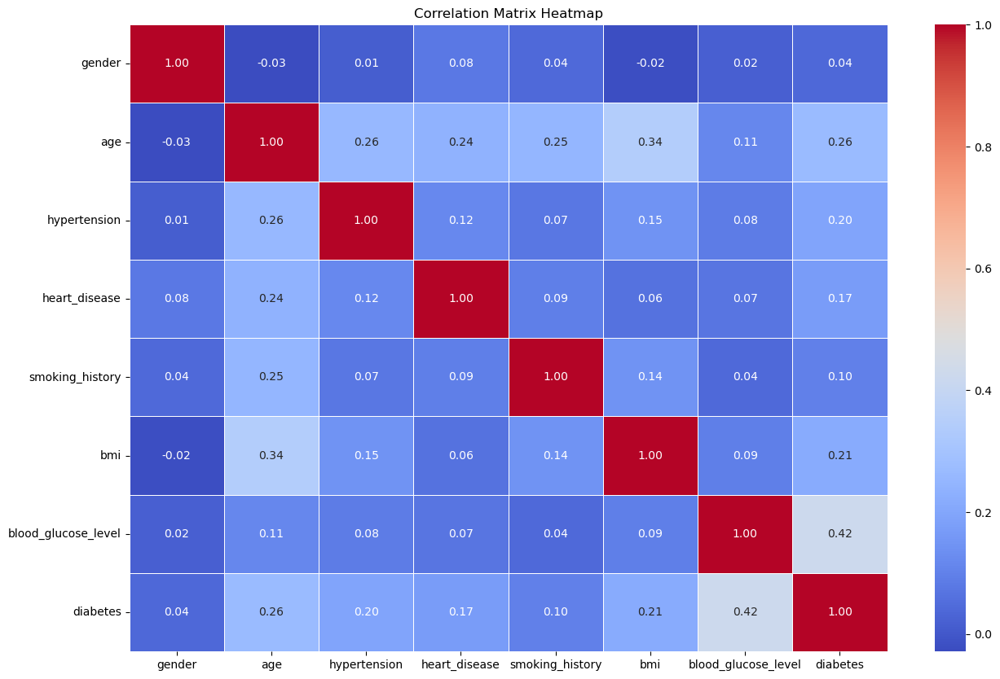

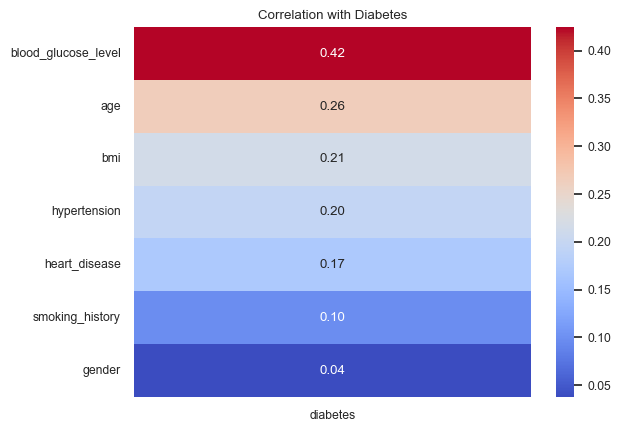

In [21]:
# Compute the correlation matrix
correlation_matrix = df.corr()
#Graph I.
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title("Correlation Matrix Heatmap")
plt.show()


#Graph II
# Create a heatmap of the correlations with the target column
corr = df.corr()
target_corr = corr['diabetes'].drop('diabetes')

# Sort correlation values in descending order
target_corr_sorted = target_corr.sort_values(ascending=False)

sns.set(font_scale=0.8)
sns.set_style("white")
sns.set_palette("PuBuGn_d")
sns.heatmap(target_corr_sorted.to_frame(), cmap="coolwarm", annot=True, fmt='.2f')
plt.title('Correlation with Diabetes')
plt.show()

In [33]:
df_new = df.copy()


In [34]:
# Split data into features and target variable
X = df_new.drop('diabetes', axis=1)
y = df_new['diabetes']


In [35]:

over = SMOTE(sampling_strategy=0.2)
under = RandomUnderSampler(sampling_strategy=0.5)

In [36]:

steps = [('o', over), ('u', under)]
pipeline = imbPipeline(steps=steps)
# transform the dataset
X, y = pipeline.fit_resample(X, y)

In [39]:
new_df = X.copy()

new_df['diabetes'] = y
new_df.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,blood_glucose_level,diabetes
0,0,39.00,0,0,1,24.46,200,0
1,0,21.00,0,0,1,15.72,145,0
2,1,53.00,1,0,1,23.00,145,0
3,0,17.00,0,0,1,23.01,85,0
4,0,16.00,0,0,1,25.41,158,0


In [40]:
print(new_df)

       gender   age  hypertension  heart_disease  smoking_history   bmi  \
0           0 39.00             0              0                1 24.46   
1           0 21.00             0              0                1 15.72   
2           1 53.00             1              0                1 23.00   
3           0 17.00             0              0                1 23.01   
4           0 16.00             0              0                1 25.41   
...       ...   ...           ...            ...              ...   ...   
52582       1 71.00             0              0                3 29.64   
52583       0 72.96             0              0                3 30.89   
52584       0 62.44             0              0                2 22.51   
52585       1 78.00             0              0                3 28.11   
52586       1 71.16             0              0                3 29.55   

       blood_glucose_level  diabetes  
0                      200         0  
1                    

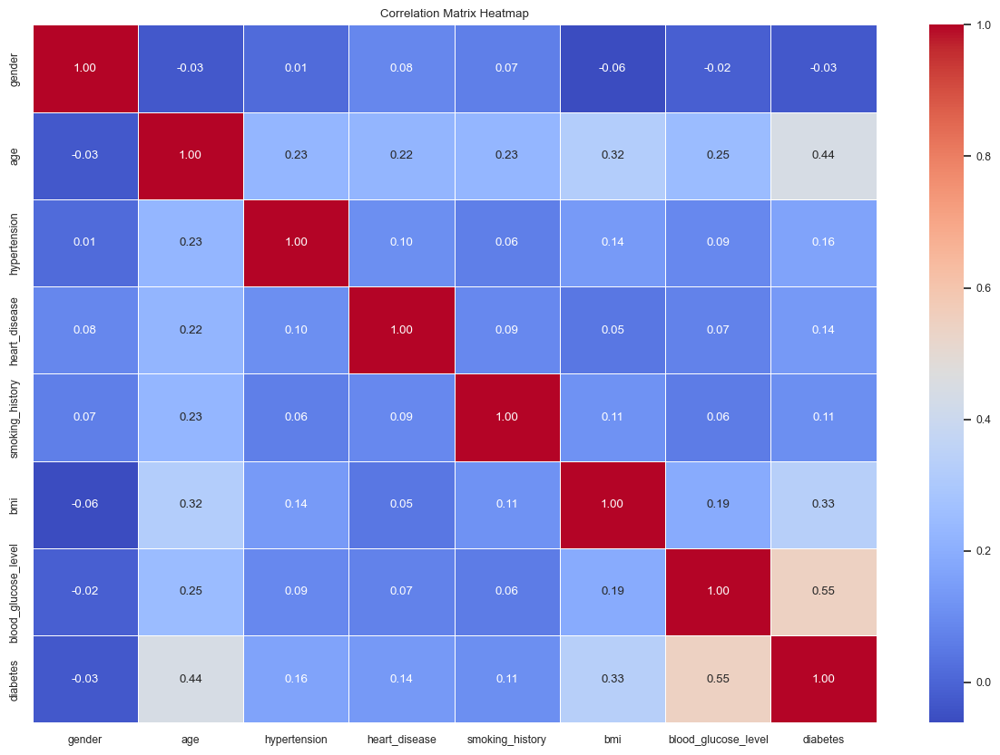

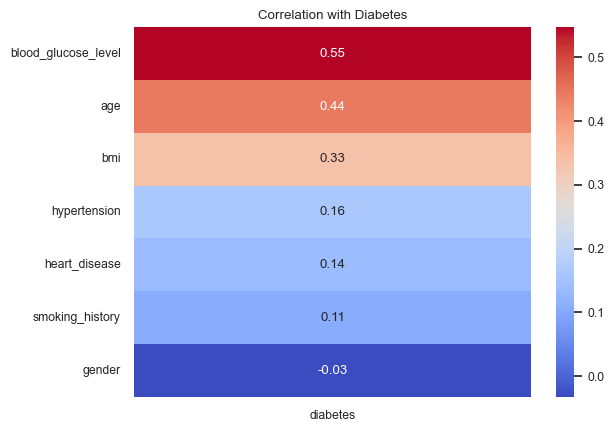

In [42]:
# Compute the correlation matrix
correlation_matrix = new_df.corr()
#Graph I.
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title("Correlation Matrix Heatmap")
plt.show()


#Graph II
# Create a heatmap of the correlations with the target column
corr = new_df.corr()
target_corr = corr['diabetes'].drop('diabetes')

# Sort correlation values in descending order
target_corr_sorted = target_corr.sort_values(ascending=False)

sns.set(font_scale=0.8)
sns.set_style("white")
sns.set_palette("PuBuGn_d")
sns.heatmap(target_corr_sorted.to_frame(), cmap="coolwarm", annot=True, fmt='.2f')
plt.title('Correlation with Diabetes')
plt.show()

In [64]:
# Import necessary libraries
from sklearn.decomposition import PCA
from sklearn.datasets import make_classification

scaler = StandardScaler()
scaler.fit(X) 
X_scaled = scaler.transform(X)
# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Explained variance
explained_variance = pca.explained_variance_
total_explained_variance = explained_variance.sum()

# Print results
print(f"Explained Variance:\n{explained_variance}")
print(f"Total Explained Variance: {total_explained_variance:.4f}")

Explained Variance:
[1.79235743 1.10853936 0.93880121 0.90692061 0.87988479 0.78064291
 0.59298681]
Total Explained Variance: 7.0001


In [65]:
explained_variance_ratio = pca.explained_variance_ratio_
total_explained_variance_ratio = explained_variance_ratio.sum()

# Print results
print(f"\nExplained Variance Ratio:\n{explained_variance_ratio}")
print(f"Total Explained Variance Ratio: {total_explained_variance_ratio:.4f}")


Explained Variance Ratio:
[0.25604619 0.15835975 0.13411191 0.12955762 0.12569544 0.11151829
 0.08471079]
Total Explained Variance Ratio: 1.0000


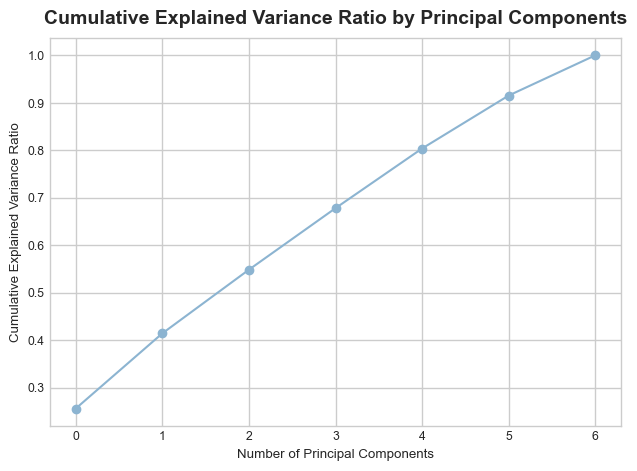

In [66]:
import numpy as np
import matplotlib.pyplot as plt

# Plot explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.plot(cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio by Principal Components')
plt.show()

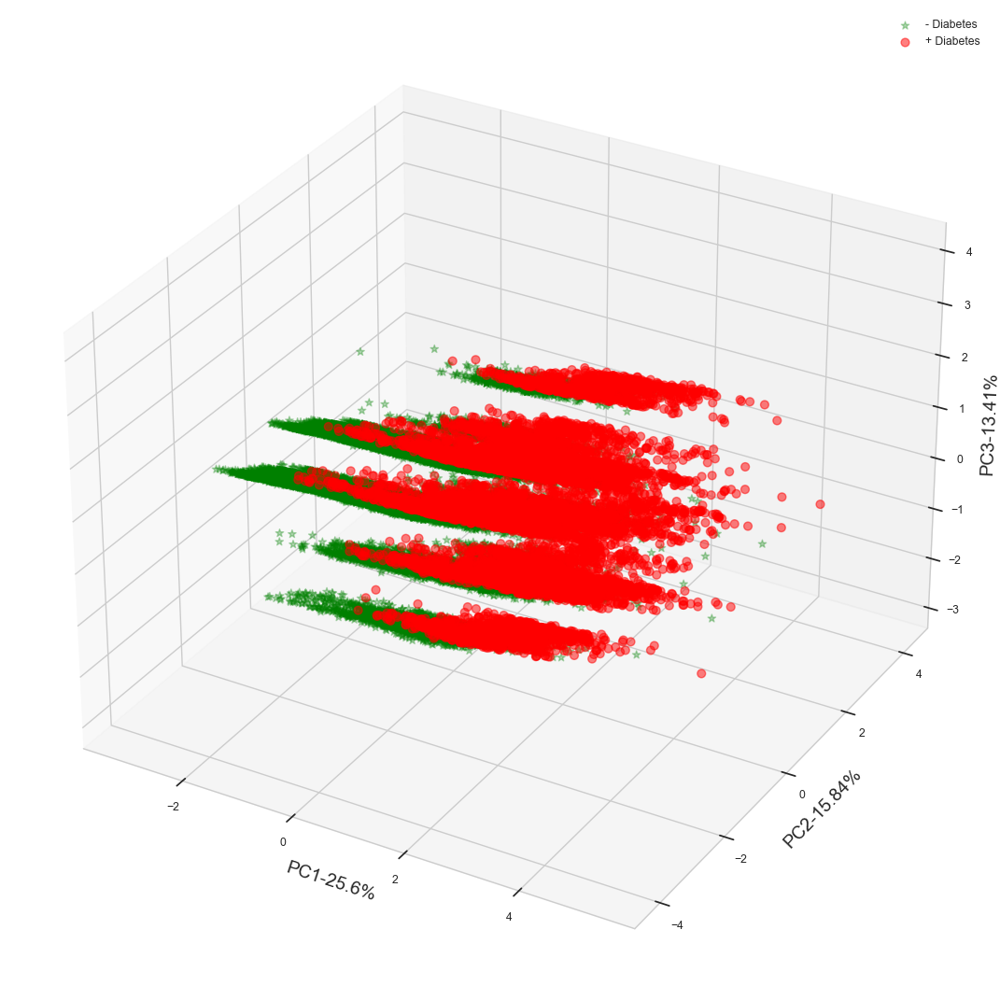

In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from sklearn.datasets import load_breast_cancer
from sklearn.decomposition import PCA
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
# %matplotlib notebook




pc1 = str(round((explained_variance_ratio[0]*100),2))
pc2 = str(round((explained_variance_ratio[1]*100),2))
pc3 = str(round((explained_variance_ratio[2]*100),2))

Xax = X_pca[:,0]
Yax = X_pca[:,1]
Zax = X_pca[:,2]

cdict = {0:'green',1:'red'}
labl = {0:'- Diabetes',1:'+ Diabetes'}
marker = {0:'*',1:'o'}
alpha = {0:.3, 1:.5}

fig = plt.figure(figsize=(19.2,10.8))
ax = fig.add_subplot(111, projection='3d')

fig.patch.set_facecolor('white')
for l in np.unique(y):
 ix=np.where(y==l)
 ax.scatter(Xax[ix], Yax[ix], Zax[ix], c=cdict[l], s=40,
           label=labl[l], marker=marker[l], alpha=alpha[l])
# for loop ends
ax.set_xlabel("PC1-" + pc1 + "%", fontsize=14)
ax.set_ylabel("PC2-" + pc2 + "%", fontsize=14)
ax.set_zlabel("PC3-" + pc3 + "%", fontsize=14)

ax.legend()
plt.show()

In [69]:
import plotly.express as px
from sklearn.decomposition import PCA


labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    X_pca,
    labels=labels,
    dimensions=range(7),
    color=y
)
fig.update_traces(diagonal_visible=False)
fig.show()

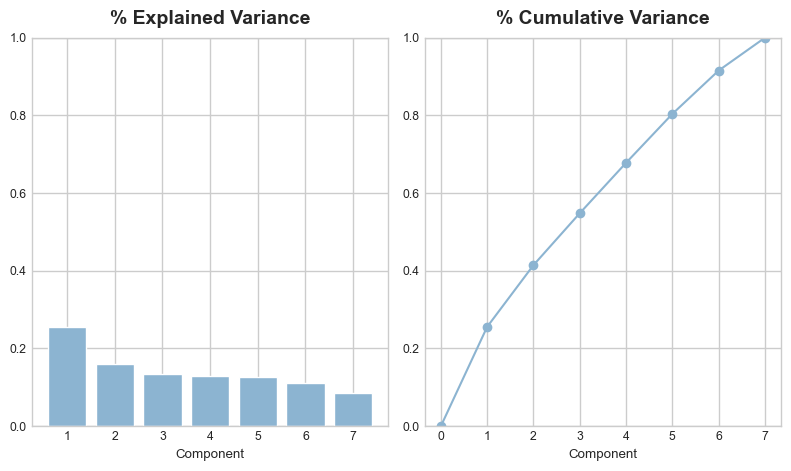

In [55]:
from sklearn.decomposition import PCA

scaler = StandardScaler()
scaler.fit(X) 
X_scaled = scaler.transform(X)
# Create principal components
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Look at explained variance
plot_variance(pca);

In [56]:
# Convert to dataframe
component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
X_pca = pd.DataFrame(X_pca, columns=component_names)

X_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,-0.57,-0.63,0.02,-0.47,-0.63,0.96,-0.40
1,-0.08,0.75,0.38,-0.02,0.61,-0.38,-1.25
2,-0.32,0.62,0.39,0.39,0.63,-0.14,-1.33
3,0.02,0.92,0.28,-0.10,0.49,-0.06,-0.84
4,-0.95,0.84,0.29,-0.17,0.33,-0.11,0.49


In [57]:
loadings = pd.DataFrame(
    pca.components_.T,  # transpose the matrix of loadings
    columns=component_names,  # so the columns are the principal components
    index=X.columns,  # and the rows are the original features
)
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
gender,-0.01,-0.73,-0.10,-0.38,-0.48,0.24,-0.12
age,0.58,0.04,-0.01,0.05,0.10,0.04,-0.80
hypertension,0.35,-0.06,0.59,0.39,-0.52,-0.25,0.20
heart_disease,0.31,-0.47,0.36,-0.05,0.67,0.15,0.28
smoking_history,0.33,-0.29,-0.69,0.39,0.03,-0.35,0.24
bmi,0.44,0.32,-0.19,-0.02,-0.18,0.71,0.35
blood_glucose_level,0.38,0.22,-0.02,-0.74,-0.05,-0.47,0.21


In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from sklearn.datasets import load_breast_cancer
from sklearn.decomposition import PCA
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
# %matplotlib notebook



ex_variance=np.var(X_pca,axis=0)
ex_variance_ratio = ex_variance/np.sum(ex_variance)
ex_variance_ratio
pc1 = str(round((ex_variance_ratio[0]*100),2))
pc2 = str(round((ex_variance_ratio[1]*100),2))
pc3 = str(round((ex_variance_ratio[2]*100),2))

Xax = X_pca[:,0]
Yax = X_pca[:,1]
Zax = X_pca[:,2]

cdict = {0:'green',1:'red'}
labl = {0:'- Diabetes',1:'+ Diabetes'}
marker = {0:'*',1:'o'}
alpha = {0:.3, 1:.5}

fig = plt.figure(figsize=(19.2,10.8))
ax = fig.add_subplot(111, projection='3d')

fig.patch.set_facecolor('white')
for l in np.unique(y):
 ix=np.where(y==l)
 ax.scatter(Xax[ix], Yax[ix], Zax[ix], c=cdict[l], s=40,
           label=labl[l], marker=marker[l], alpha=alpha[l])
# for loop ends
ax.set_xlabel("PC1-" + pc1 + "%", fontsize=14)
ax.set_ylabel("PC2-" + pc2 + "%", fontsize=14)
ax.set_zlabel("PC3-" + pc3 + "%", fontsize=14)

ax.legend()
plt.show()

InvalidIndexError: (slice(None, None, None), 0)

[None, None]

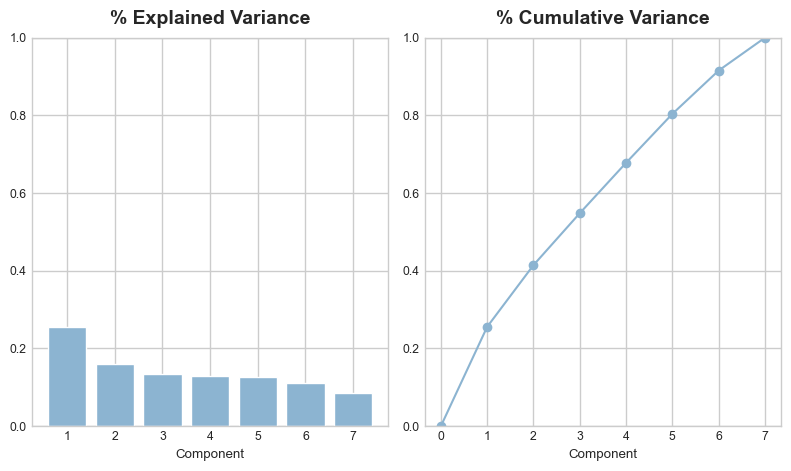

In [59]:
fig, axs = plt.subplots(1, 2)
n = pca.n_components_
grid = np.arange(1, n + 1)
# Explained variance
axs[0].bar(grid, ex_variance_ratio)
axs[0].set(xlabel="Component", title="% Explained Variance", ylim=(0.0, 1.0))

# Cumulative Variance
cv = np.cumsum(ex_variance_ratio)
axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
axs[1].set(xlabel="Component", title="% Cumulative Variance", ylim=(0.0, 1.0))
# Set up figure
fig.set(figwidth=8, dpi=100)

In [60]:
import plotly.express as px
from sklearn.decomposition import PCA

scaler = StandardScaler()
scaler.fit(X) 
X_scaled = scaler.transform(X)

pca = PCA()
pca.fit(X_scaled) 
X_pca = pca.transform(X_scaled) 

labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    X_pca,
    labels=labels,
    dimensions=range(7),
    color=df_new['diabetes']
)
fig.update_traces(diagonal_visible=False)
fig.show()

ValueError: All arguments should have the same length. The length of argument `color` is 96128, whereas the length of  previously-processed arguments ['0', '1', '2', '3', '4', '5', '6'] is 52587

In [23]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display
from sklearn.feature_selection import mutual_info_regression


plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)


def plot_variance(pca, width=8, dpi=100):
    # Create figure
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)
    # Explained variance
    explained_variance = pca.explained_variance_ratio_
    axs[0].bar(grid, explained_variance)
    axs[0].set(
        xlabel="Component", title="% Explained Variance", ylim=(0.0, 1.0)
    )
    # Cumulative Variance
    cv = np.cumsum(explained_variance)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(
        xlabel="Component", title="% Cumulative Variance", ylim=(0.0, 1.0)
    )
    # Set up figure
    fig.set(figwidth=8, dpi=100)
    return axs

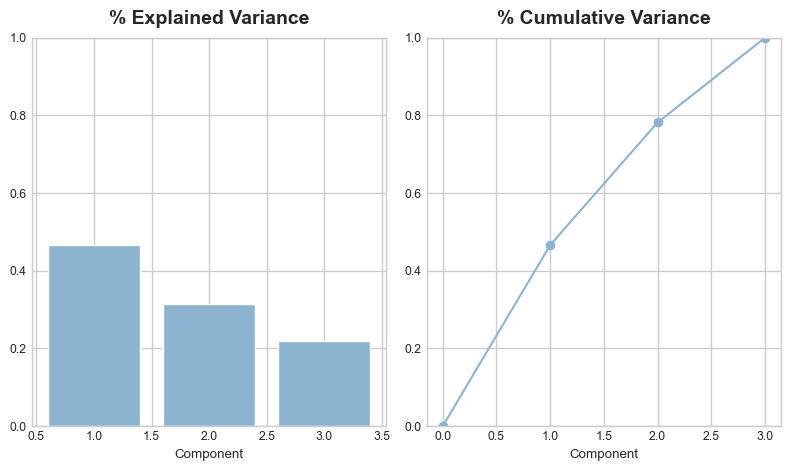

In [24]:
from sklearn.decomposition import PCA

# Standardize
X = df_new[['blood_glucose_level', 'bmi', 'age']]
X_scaled = (X - X.mean(axis=0)) / X.std(axis=0)

# Create principal components
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Look at explained variance
plot_variance(pca);

In [25]:
# Convert to dataframe
component_names = [f"PC{i+1}" for i in range(X_pca.shape[1])]
X_pca = pd.DataFrame(X_pca, columns=component_names)

X_pca.head()

,PC1,PC2,PC3
0,0.94,-0.23,-1.43
1,-0.13,-1.45,-0.46
2,-0.24,0.58,0.46
3,-0.41,0.60,-0.20
4,0.46,0.36,-1.81


In [26]:
loadings = pd.DataFrame(
    pca.components_.T,  # transpose the matrix of loadings
    columns=component_names,  # so the columns are the principal components
    index=X.columns,  # and the rows are the original features
)
loadings

,PC1,PC2,PC3
blood_glucose_level,0.34,0.94,0.05
bmi,0.66,-0.28,0.70
age,0.67,-0.21,-0.71


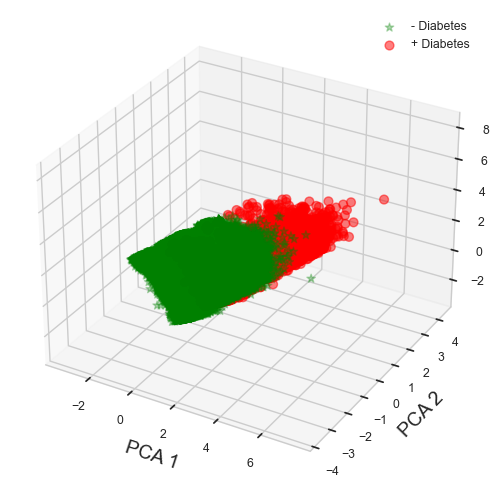

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from sklearn.datasets import load_breast_cancer
from sklearn.decomposition import PCA
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
# %matplotlib notebook

X = df_new[['blood_glucose_level', 'bmi', 'age']]
y = df_new['diabetes']# Define resampling
sc = StandardScaler()

scaler = StandardScaler()
scaler.fit(X) 
X_scaled = scaler.transform(X)

pca = PCA(n_components=3)
pca.fit(X_scaled) 
X_pca = pca.transform(X_scaled) 

ex_variance=np.var(X_pca,axis=0)
ex_variance_ratio = ex_variance/np.sum(ex_variance)
ex_variance_ratio

Xax = X_pca[:,0]
Yax = X_pca[:,1]
Zax = X_pca[:,2]

cdict = {0:'green',1:'red'}
labl = {0:'- Diabetes',1:'+ Diabetes'}
marker = {0:'*',1:'o'}
alpha = {0:.3, 1:.5}

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')

fig.patch.set_facecolor('white')
for l in np.unique(y):
 ix=np.where(y==l)
 ax.scatter(Xax[ix], Yax[ix], Zax[ix], c=cdict[l], s=40,
           label=labl[l], marker=marker[l], alpha=alpha[l])
# for loop ends
ax.set_xlabel("PCA 1", fontsize=14)
ax.set_ylabel("PCA 2", fontsize=14)
ax.set_zlabel("PCA 3", fontsize=14)

ax.legend()
plt.show()

In [29]:
# Import necessary libraries
from sklearn.decomposition import PCA
from sklearn.datasets import make_classification

# Generate a synthetic dataset
X = df_new.drop('diabetes', axis=1)
y = df_new['diabetes']# Define resampling
sc = StandardScaler()

scaler = StandardScaler()
scaler.fit(X) 
X_scaled = scaler.transform(X)

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Explained variance
explained_variance = pca.explained_variance_
total_explained_variance = explained_variance.sum()

# Print results
print(f"Explained Variance:\n{explained_variance}")
print(f"Total Explained Variance: {total_explained_variance:.4f}")

Explained Variance:
[1.68365204e+03 5.00752901e+02 3.97767298e+01 6.16185033e-01
 2.41788691e-01 6.66034856e-02 3.61684077e-02]
Total Explained Variance: 2225.1424


In [31]:
explained_variance_ratio = pca.explained_variance_ratio_
total_explained_variance_ratio = explained_variance_ratio.sum()

# Print results
print(f"\nExplained Variance Ratio:\n{explained_variance_ratio}")
print(f"Total Explained Variance Ratio: {total_explained_variance_ratio:.4f}")


Explained Variance Ratio:
[7.56649115e-01 2.25043079e-01 1.78760377e-02 2.76919368e-04
 1.08662119e-04 2.99322349e-05 1.62544237e-05]
Total Explained Variance Ratio: 1.0000


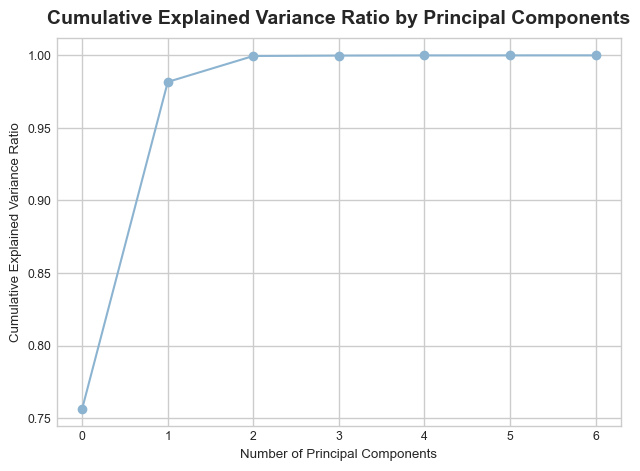

In [32]:
import numpy as np
import matplotlib.pyplot as plt

# Plot explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.plot(cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio by Principal Components')
plt.show()

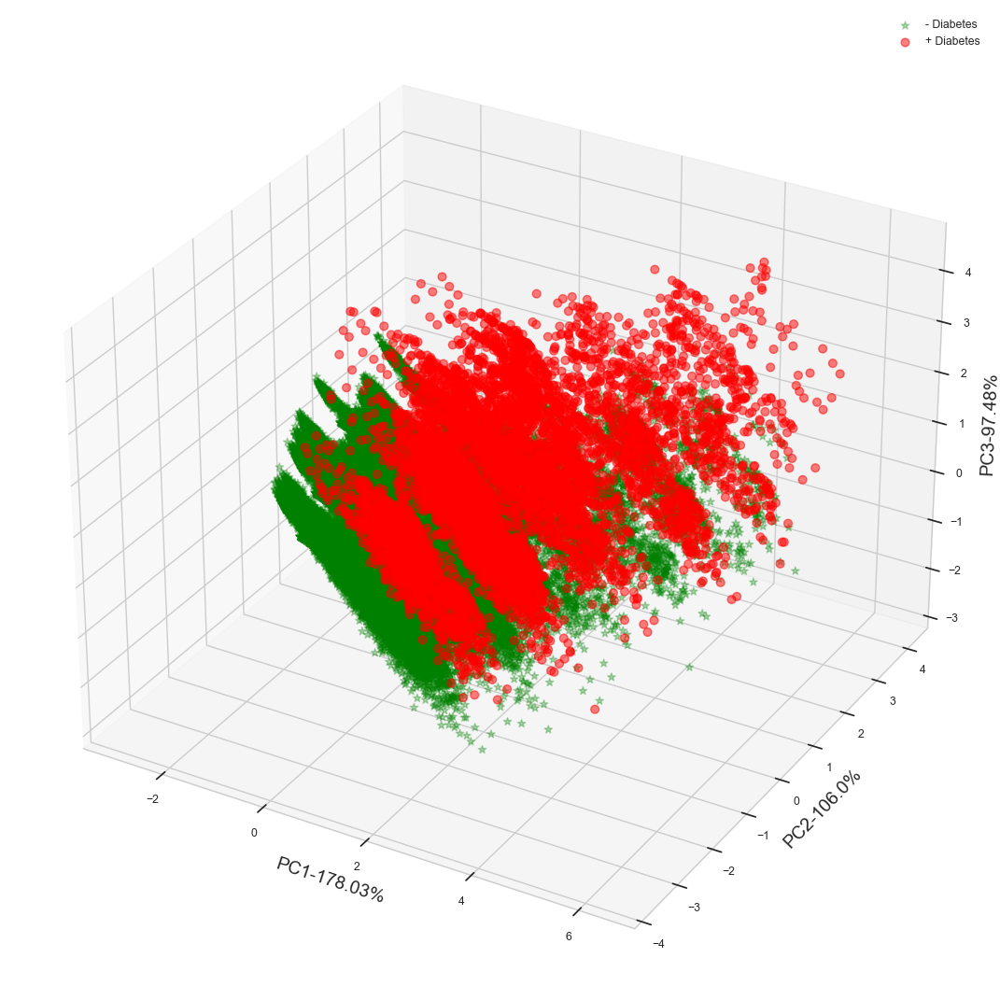

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from sklearn.datasets import load_breast_cancer
from sklearn.decomposition import PCA
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
# %matplotlib notebook

X = df_new.drop('diabetes', axis=1)
y = df_new['diabetes']# Define resampling
sc = StandardScaler()

scaler = StandardScaler()
scaler.fit(X) 
X_scaled = scaler.transform(X)

pca = PCA(n_components=3)
pca.fit(X_scaled) 
X_pca = pca.transform(X_scaled) 

ex_variance_ratio = pca.explained_variance_
ex_variance_ratio
pc1 = str(round((ex_variance_ratio[0]*100),2))
pc2 = str(round((ex_variance_ratio[1]*100),2))
pc3 = str(round((ex_variance_ratio[2]*100),2))

Xax = X_pca[:,0]
Yax = X_pca[:,1]
Zax = X_pca[:,2]

cdict = {0:'green',1:'red'}
labl = {0:'- Diabetes',1:'+ Diabetes'}
marker = {0:'*',1:'o'}
alpha = {0:.3, 1:.5}

fig = plt.figure(figsize=(19.2,10.8))
ax = fig.add_subplot(111, projection='3d')

fig.patch.set_facecolor('white')
for l in np.unique(y):
 ix=np.where(y==l)
 ax.scatter(Xax[ix], Yax[ix], Zax[ix], c=cdict[l], s=40,
           label=labl[l], marker=marker[l], alpha=alpha[l])
# for loop ends
ax.set_xlabel("PC1-" + pc1 + "%", fontsize=14)
ax.set_ylabel("PC2-" + pc2 + "%", fontsize=14)
ax.set_zlabel("PC3-" + pc3 + "%", fontsize=14)

ax.legend()
plt.show()

In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA


labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    X_pca,
    labels=labels,
    dimensions=range(3),
    color=df_new['diabetes']
)
fig.update_traces(diagonal_visible=False)
fig.show()